In [155]:
#'''Importing Data Manipulation Modules'''
import numpy as np                 # Linear Algebra
import pandas as pd                # Data Processing, CSV file I/O (e.g. pd.read_csv)

#'''Seaborn and Matplotlib Visualization'''
import matplotlib                  # 2D Plotting Library
import matplotlib.pyplot as plt
import seaborn as sns              # Python Data Visualization Library based on matplotlib
import geopandas as gpd            # Python Geospatial Data Library
plt.style.use('fivethirtyeight')
%matplotlib inline

#'''Plotly Visualizations'''
import plotly as plotly                # Interactive Graphing Library for Python
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot, plot
init_notebook_mode(connected=True)

#'''Spatial Visualizations'''
import folium
import folium.plugins

#'''NLP - WordCloud'''
from wordcloud import WordCloud, ImageColorGenerator, STOPWORDS
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

from plotly import tools


In [57]:
from PIL import Image

# Reading the Dataset

In [76]:
# reading the dataset
df = pd.read_csv('Police_Department_Incidents_-_Previous_Year__2016_.csv')

# Summary of Dataset

In [7]:
print('Rows     :',df.shape[0])
print('Columns  :',df.shape[1])
print('\nFeatures :\n     :',df.columns.tolist())
print('\nMissing values    :',df.isnull().values.sum())
print('\nUnique values :  \n',df.nunique())

Rows     : 150500
Columns  : 13

Features :
     : ['IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date', 'Time', 'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location', 'PdId']

Missing values    : 1

Unique values :  
 IncidntNum    116699
Category          39
Descript         726
DayOfWeek          7
Date             366
Time            1439
PdDistrict        10
Resolution        14
Address        16130
X              19386
Y              19386
Location       19386
PdId          150500
dtype: int64


# Checking the null value

In [11]:
df.isnull().sum()

IncidntNum    0
Category      0
Descript      0
DayOfWeek     0
Date          0
Time          0
PdDistrict    1
Resolution    0
Address       0
X             0
Y             0
Location      0
PdId          0
dtype: int64

In [15]:
# filling the missing value in PdDistrict using the mode values
df['PdDistrict'].fillna(df['PdDistrict'].mode()[0],inplace = True)

# Data Visualization

In [18]:
df.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168
2,141059263,WARRANTS,WARRANT ARREST,Monday,04/25/2016 12:00:00 AM,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,01/05/2016 12:00:00 AM,23:50,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,01/01/2016 12:00:00 AM,00:30,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000


In [19]:
df['Category'].value_counts()

LARCENY/THEFT                  40409
OTHER OFFENSES                 19599
NON-CRIMINAL                   17866
ASSAULT                        13577
VANDALISM                       8589
VEHICLE THEFT                   6419
WARRANTS                        5914
BURGLARY                        5802
SUSPICIOUS OCC                  5782
MISSING PERSON                  4338
DRUG/NARCOTIC                   4243
ROBBERY                         3299
FRAUD                           2635
SECONDARY CODES                 1841
TRESPASS                        1812
WEAPON LAWS                     1658
SEX OFFENSES, FORCIBLE           940
STOLEN PROPERTY                  882
RECOVERED VEHICLE                736
DISORDERLY CONDUCT               658
PROSTITUTION                     641
FORGERY/COUNTERFEITING           619
DRUNKENNESS                      465
DRIVING UNDER THE INFLUENCE      378
ARSON                            286
KIDNAPPING                       257
EMBEZZLEMENT                     168
L

### In the above, graph shows the number of game genres in the data set according to their platforms. For example, 348 of the games in the data set and played on the PS2 Platform are action, 400 are sports, 222 are misc and so on. In the data set we see that the platforms with the most games are PS2 and DS¶

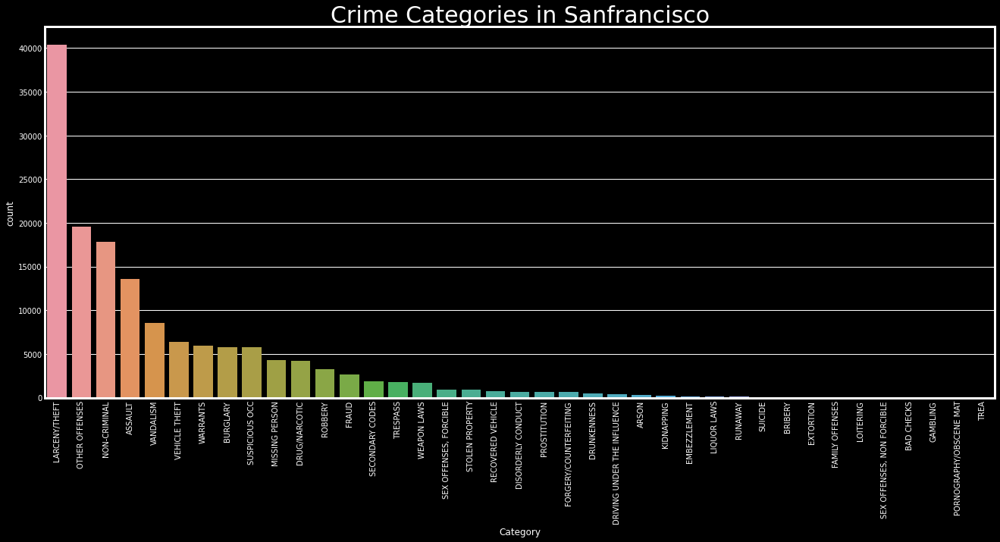

In [80]:
plt.rcParams['figure.figsize'] = (20, 9)
plt.style.use('dark_background')
sns.countplot(x = 'Category', data = df, order = df['Category'].value_counts().index)
plt.title('Crime Categories in Sanfrancisco', fontweight = 40, fontsize = 30)
plt.xticks(rotation = 90)
plt.show()


In [44]:
df['PdDistrict'].value_counts()

SOUTHERN      28446
NORTHERN      20100
MISSION       19503
CENTRAL       17666
BAYVIEW       14303
INGLESIDE     11594
TARAVAL       11325
TENDERLOIN     9942
RICHMOND       8922
PARK           8699
Name: PdDistrict, dtype: int64

### In the above, graph shows the number of different districts  in the data set according to crime genres. For example, 9204 crimes in the data set were found in the "theft" genre, which  were happened in Southern area. In the data set we see that the crime genre with the most number is  larceny/theft.

In [115]:
xSOUTHERN = df[df['PdDistrict'] == 'SOUTHERN']
xNORTHERN = df[df['PdDistrict'] == 'NORTHERN']
xMISSION = df[df['PdDistrict'] == 'MISSION']
xCENTRAL = df[df['PdDistrict'] == 'CENTRAL']
xBAYVIEW = df[df['PdDistrict'] == 'BAYVIEW']
xINGLESIDE = df[df['PdDistrict'] == 'INGLESIDE']
xTARAVAL  = df[df['PdDistrict'] == 'TARAVAL ']
xTENDERLOIN = df[df['PdDistrict'] == 'TENDERLOIN']
xRICHMOND = df[df['PdDistrict'] == 'RICHMOND']
xPARK = df[df['PdDistrict'] == 'PARK']

In [79]:
trace1 = go.Histogram(
    x=xSOUTHERN['Category'],
    opacity=0.75,
    name = "SOUTHERN",
    marker=dict(color='rgb(165,0,38)'))
trace2 = go.Histogram(
    x=xNORTHERN['Category'],
    opacity=0.75,
    name = "NORTHERN",
    marker=dict(color='rgb(215,48,39)'))
trace3 = go.Histogram(
    x=xMISSION['Category'],
    opacity=0.75,
    name = "MISSION",
    marker=dict(color='rgb(244,109,67)'))
trace4 = go.Histogram(
    x=xCENTRAL['Category'],
    opacity=0.75,
    name = "CENTRAL",
    marker=dict(color='rgb(253,174,97)'))
trace5 = go.Histogram(
    x=xBAYVIEW['Category'],
    opacity=0.75,
    name = "BAYVIEW",
    marker=dict(color='rgb(254,224,144)'))
trace6 = go.Histogram(
    x=xINGLESIDE['Category'],
    opacity=0.75,
    name = "INGLESIDE",
    marker=dict(color='rgb(170,253,87)'))
trace7 = go.Histogram(
    x=xTARAVAL['Category'],
    opacity=0.75,
    name = "TARAVAL",
    marker=dict(color='rgb(171,217,233)'))
trace8 = go.Histogram(
    x=xTENDERLOIN['Category'],
    opacity=0.75,
    name = "TENDERLOIN",
    marker=dict(color='rgb(116,173,209)'))
trace9 = go.Histogram(
    x=xRICHMOND['Category'],
    opacity=0.75,
    name = "RICHMOND",
    marker=dict(color='rgb(69,117,180)'))
trace10 = go.Histogram(
    x=xPARK['Category'],
    opacity=0.75,
    name = "PARK",
    marker=dict(color='rgb(49,54,149)'))

data = [trace1, trace2,trace3,trace4,trace5,trace6,trace7,trace8,trace9,trace10]
layout = go.Layout(barmode='stack',
                   title='District Counts According to Crime genres',
                   xaxis=dict(title='Crime genres'),
                   yaxis=dict( title='Count'),
                   paper_bgcolor='beige',
                   plot_bgcolor='beige'
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [49]:
df.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168
2,141059263,WARRANTS,WARRANT ARREST,Monday,04/25/2016 12:00:00 AM,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,01/05/2016 12:00:00 AM,23:50,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,01/01/2016 12:00:00 AM,00:30,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000


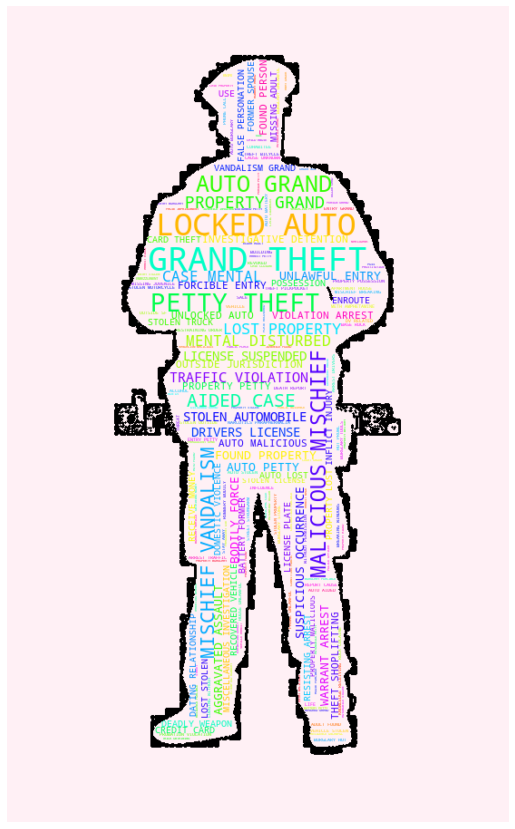

In [65]:
wave_mask= np.array(Image.open("policeman-silhouette-silhouette-policeman-white-background-135347935.jpg"))
stopwords = set(STOPWORDS)
stopwords.update(["II", "III"])
plt.subplots(figsize=(15,15))
wordcloud = WordCloud(mask=wave_mask,background_color="lavenderblush",colormap="hsv" ,contour_width=2, contour_color="black",
                      width=950,stopwords=stopwords,
                          height=950
                         ).generate(" ".join(df.Descript))

plt.imshow(wordcloud ,interpolation='bilinear')
plt.axis('off')
plt.savefig('graph.png')

plt.show()

#### As we can see, the number of crimes everyday throughout the week tend to be quite similiar, but if we want to be picky, Friday  definitly has the highest number of crimes.

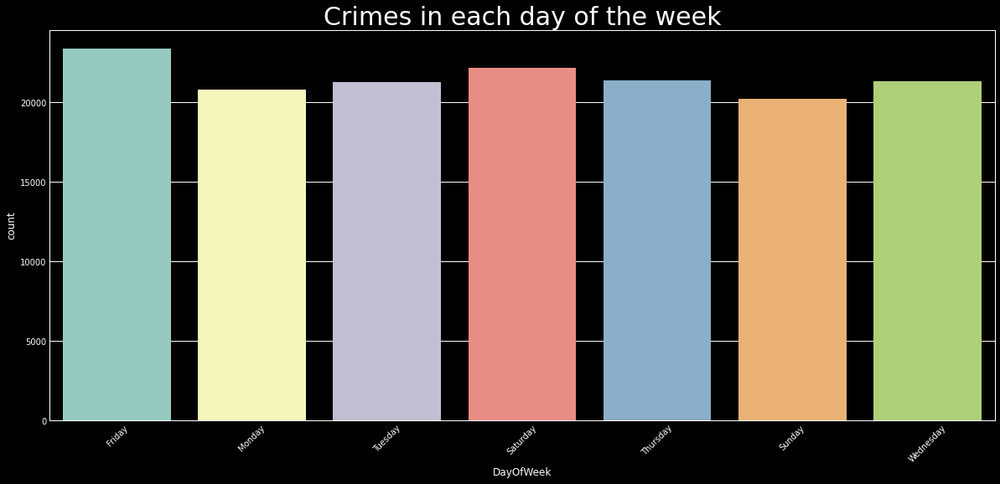

In [89]:
plt.rcParams['figure.figsize'] = (18, 8)
plt.style.use('dark_background')
sns.countplot(x = 'DayOfWeek', data = df)
plt.title('Crimes in each day of the week', fontweight = 40, fontsize = 30)
plt.xticks(rotation = 45)
plt.show()



# Crime counts according to each month 

In [92]:
df['Date'] = pd.to_datetime(df['Date'])

In [93]:
def get_month(x):
    return x.month

In [108]:
df['month'].unique()

array([ 1,  4,  9,  2, 10,  8,  7,  3, 12,  5,  6, 11])

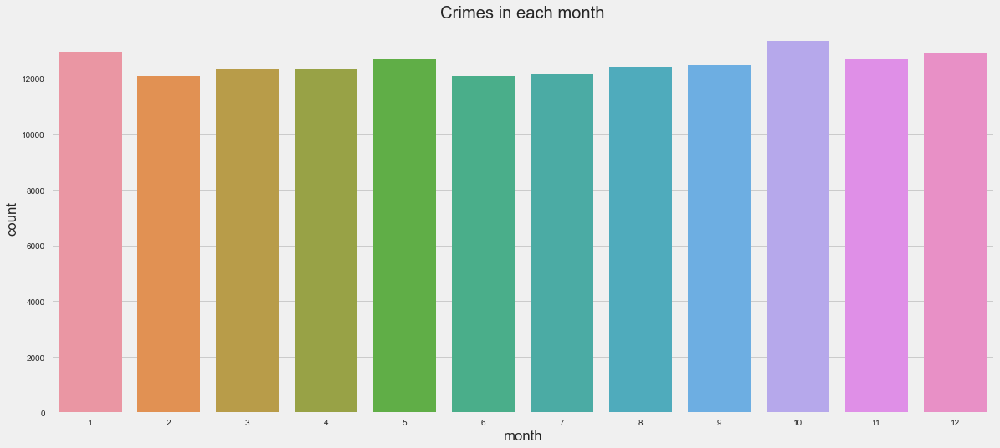

In [124]:
plt.rcParams['figure.figsize'] = (18,8)

plt.style.use('fivethirtyeight')

sns.countplot(x = 'month', data = df)

plt.title('Crimes in each month')

plt.show()

In [128]:
df.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId,month
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,2016-01-29,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120,1
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,2016-01-29,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168,1
2,141059263,WARRANTS,WARRANT ARREST,Monday,2016-04-25,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010,4
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,2016-01-05,23:50,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000,1
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,2016-01-01,00:30,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000,1


#### Choosing 'NONE','ARREST, BOOKED','UNFOUNDED','JUVENILE BOOKED' as the most 4 common resolutions, comparing with Category column, for example, for the 'sex offenses':  there are 674 cases were none resolution, 215 were arrested, 27 were unfounded, 18 were exceptional.

In [127]:
df['Resolution'].value_counts()

NONE                                      107780
ARREST, BOOKED                             39416
UNFOUNDED                                   1608
JUVENILE BOOKED                             1056
EXCEPTIONAL CLEARANCE                        371
ARREST, CITED                                144
CLEARED-CONTACT JUVENILE FOR MORE INFO        58
NOT PROSECUTED                                22
LOCATED                                       20
PSYCHOPATHIC CASE                             17
JUVENILE CITED                                 3
JUVENILE DIVERTED                              2
COMPLAINANT REFUSES TO PROSECUTE               2
PROSECUTED BY OUTSIDE AGENCY                   1
Name: Resolution, dtype: int64

In [132]:
none = df[df['Resolution'] == 'NONE']
arrest = df[df['Resolution'] == 'ARREST, BOOKED']
unfounded = df[df['Resolution'] == 'UNFOUNDED']
juvenile = df[df['Resolution'] == 'JUVENILE BOOKED ']
exceptional = df[df['Resolution'] == 'EXCEPTIONAL CLEARANCE']

In [135]:
none_category = pd.DataFrame(none['Category'].value_counts())
arrest_category = pd.DataFrame(arrest['Category'].value_counts())
unfounded_category = pd.DataFrame(unfounded['Category'].value_counts())
juvenile_category = pd.DataFrame(juvenile['Category'].value_counts())
exceptional_category = pd.DataFrame(exceptional['Category'].value_counts())

In [158]:
trace0 = go.Scatter(
    x = none_category.index,
    y = none_category["Category"],
    mode = 'markers',
    name = 'none',
    marker= dict(size= 14,
                    line= dict(width=1),
                    color= "lime",
                    opacity= 0.7
                   )
)
trace1 = go.Scatter(
    x = arrest_category.index,
    y = arrest_category["Category"],
    mode = 'markers',
    name = 'arrest',
       marker= dict(size= 14,
                    line= dict(width=1),
                    color= "firebrick",
                    opacity= 0.7,
                   symbol=220
                   )
)
trace2 = go.Scatter(
    x = unfounded_category.index,
    y = unfounded_category["Category"],
    mode = 'markers',
    name = 'unfounded',
    marker= dict(size= 14,
                    line= dict(width=1),
                    color='rgba(150, 26, 80, 0.8)',
                    opacity= 0.7
                   )
)
trace3 = go.Scatter(
    x = juvenile_category.index,
    y = juvenile_category["Category"],
    mode = 'markers',
    name = 'juvenile',
       marker= dict(size= 14,
                    line= dict(width=1),
                    color= 'rgba(28, 149, 249, 0.8)',
                    opacity= 0.7,
                    symbol=220
                   )
)

trace4 = go.Scatter(
    x = exceptional_category.index,
    y = exceptional_category["Category"],
    mode = 'markers',
    name = 'exceptional',
    marker= dict(size= 14,
                    line= dict(width=1),
                    color= 'rgba(249, 94, 28, 0.8)',
                    opacity= 0.7
                   )
)


fig = tools.make_subplots(rows=2, cols=2, 
                          subplot_titles=('Category','Category','Category'))


fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 2, 1)
fig.append_trace(trace4, 1, 2)


fig['layout'].update(showlegend=False,height=800, width=800, title="Crime categories sort by different resolutions " ,paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor="moccasin")
iplot(fig)

In [160]:
none_PdDistrict = pd.DataFrame(none['PdDistrict'].value_counts())
arrest_PdDistrict = pd.DataFrame(arrest['PdDistrict'].value_counts())
unfounded_PdDistrict = pd.DataFrame(unfounded['PdDistrict'].value_counts())
juvenile_PdDistrict = pd.DataFrame(juvenile['PdDistrict'].value_counts())
exceptional_PdDistricty = pd.DataFrame(exceptional['PdDistrict'].value_counts())

In [162]:
data8=[go.Scatterpolar(
      r = list(none_PdDistrict["PdDistrict"].values),
      theta = none_PdDistrict.index,
      fill = 'toself',
      name = "none",
    thetaunit = "radians",
    ),
 go.Scatterpolar(
      r = list(arrest_PdDistrict["PdDistrict"].values),
      theta = arrest_PdDistrict.index,
      fill = 'toself',
      name = 'arrest',
    thetaunit = "radians"
    ),
go.Scatterpolar(
      r = unfounded_PdDistrict["PdDistrict"].values,
      theta = unfounded_PdDistrict.index,
      fill = 'toself',
      name = "unfounded",
    thetaunit = "radians",
     subplot = "polar2"
    ),
go.Scatterpolar(
      r = exceptional_PdDistricty["PdDistrict"].values,
      theta =exceptional_PdDistricty.index,
      fill = 'toself',
      name = 'exceptional',
    subplot = "polar2",
    thetaunit = "radians"
    )]

In [176]:
layout = go.Layout(
    showlegend=False,
    paper_bgcolor='moccasin',
    title="District - Resolution",
    font=dict(family='Gravitas One',size=20,color='darkred'),
     
    
    polar = dict(
      bgcolor="linen",
      domain = dict(
        y = [0.60, 0.90],
        x = [0, 0.48]
      ),
      radialaxis = dict(
             visible = False,
        angle = 45
      ),
      angularaxis = dict(
        direction = "clockwise",
        period = 6,
          gridwidth=3,
          tickfont=dict(size=11,color="black"),
      )
    ),
    polar2 = dict(
        bgcolor="linen",
      domain = dict(
        y = [0.60, 0.90],
        x = [0.52, 1]
      ),
      radialaxis = dict(
             visible = False,
        angle = 45
      ),
      angularaxis = dict(
        direction = "clockwise",
        period = 5,
           gridwidth=3,
          tickfont=dict(size=11,color="black"),
      )),
    
     annotations=[dict(showarrow=False,text="District",x=0.18,y=1.05,xref="paper",yref="paper",font=dict(size=15,color="midnightblue"),bgcolor="lightyellow",borderwidth=5),
                                  dict(showarrow=False,text="District",x=0.83,y=1.05,xref="paper",yref="paper",font=dict(size=15,color="midnightblue"),bgcolor="lightyellow",borderwidth=5)
                                  ]
)

fig = go.Figure(data=data8,layout=layout)
iplot(fig)

# Crime Distribution in a Heat Map

# The highest Density areas are marked in red and lowest density areas are marked in blue color

In [201]:
import folium
from folium.plugins import HeatMap
m=folium.Map([37.7749,-122.4194],zoom_start=11)
HeatMap(df[['Y','X']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
display(m)

In [217]:
df.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId,month
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,2016-01-29,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120,1
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,2016-01-29,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168,1
2,141059263,WARRANTS,WARRANT ARREST,Monday,2016-04-25,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010,4
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,2016-01-05,23:50,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000,1
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,2016-01-01,00:30,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000,1


<AxesSubplot:>

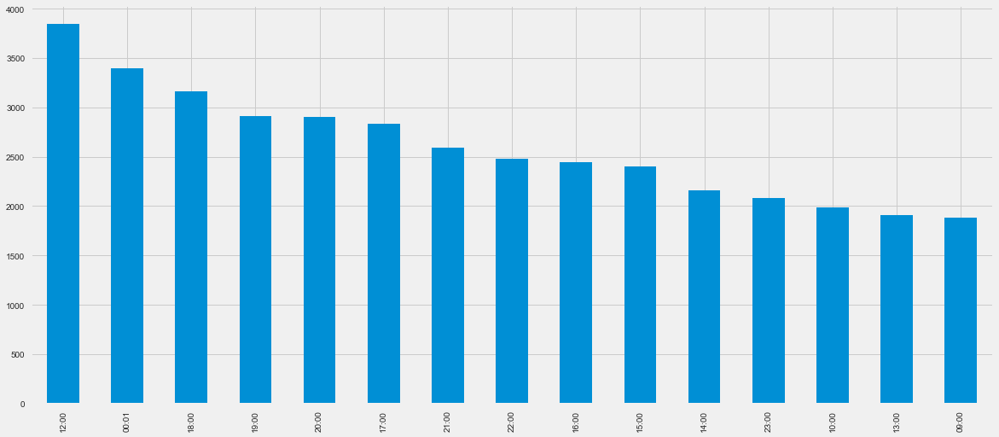

In [229]:
plt.rcParams['figure.figsize'] = (18,8)

plt.style.use('fivethirtyeight')

df['Time'].value_counts()[:15].plot.bar()